## Import

In [4]:
import os
import cv2
from PIL import Image
import pandas as pd
import numpy as np

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from tqdm import tqdm
import albumentations as A
from albumentations.pytorch import ToTensorV2

import torch.optim as optim
from torch.optim.lr_scheduler import StepLR
#from early_stopping import EarlyStopping

import segmentation_models_pytorch as smp
import matplotlib.pyplot as plt
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)
print(torch.cuda.is_available())

from albumentations.core.transforms_interface import DualTransform

import sys
sys.path.append('./FisheyeSeg-master') 
from data.FishEyeGenerator import FishEyeGenerator

import warnings
warnings.filterwarnings("ignore")


cuda
True


## Utils

In [5]:
# RLE 인코딩 함수
def rle_encode(mask):
    pixels = mask.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

## Custom Dataset

In [3]:
class CustomDataset(Dataset):
    def __init__(self, csv_file, transform=None, infer=False):
        self.data = pd.read_csv(csv_file)
        self.transform = transform
        self.infer = infer
    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path = self.data.iloc[idx, 1]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        #image = image.astype(np.float32)
        if self.infer:
            if self.transform:
                image = self.transform(image=image)['image']
            return image
        else:
            self._generator = FishEyeGenerator(200, [640,640])
        mask_path = self.data.iloc[idx, 2]
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask[mask == 255] = 12 #배경을 픽셀값 12로 간주

        self._EXT_PARAM_RANGE = [5, 5, 10, 0.3, 0.3, 0.4]
        self._generator.set_ext_param_range(self._EXT_PARAM_RANGE)
        self._generator.rand_ext_params()
        self._F_RANGE = [200,350]
        self._generator.rand_f(self._F_RANGE)
        self._generator.set_bkg(bkg_label=12,bkg_color=[0,0,0])
        image = self._generator.transFromColor(image)
        mask = self._generator.transFromGray(mask)
        image = image.astype(np.uint8)
        mask = mask.astype(np.uint8)
        #mask[mask == 255] = 12 #배경을 픽셀값 12로 간주
        # image=image.astype(np.uint8)
        # #mask=mask.astype(np.uint8)

        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']

        return image, mask    

# loss function

In [4]:
# import torch
# import torch.nn as nn
# from segmentation_models_pytorch.losses import LovaszLoss


# # CE Loss를 불러오기
# ce_loss = nn.CrossEntropyLoss()

# # Lovasz Loss를 불러오기
# lovasz_loss = LovaszLoss(mode='multiclass')  # Lovasz Loss를 다중 클래스용으로 설정

# # CE + Lovasz 손실 함수를 정의
# class CELovaszLoss(nn.Module):
#     def __init__(self, alpha_ce=0.3, alpha_lovasz=0.7):
#         super(CELovaszLoss, self).__init__()
#         self.alpha_ce = alpha_ce
#         self.alpha_lovasz = alpha_lovasz
        
#     def forward(self, inputs, targets):
#         # CE Loss 계산
#         ce_loss_value = ce_loss(inputs, targets)
        
#         # Lovasz Loss 계산
#         lovasz_loss_value = lovasz_loss(inputs, targets)
        
#         # CE + Lovasz 손실 함수 계산
#         celovasz_loss = self.alpha_ce * ce_loss_value + self.alpha_lovasz * lovasz_loss_value
        
#         return celovasz_loss

fish eye 

In [5]:
# class FESetsGenerator:

#     def __init__(self, dst_shape, focal_len=350):
#         self._generator = FishEyeGenerator(focal_len, dst_shape)

#         self._F_RAND_FLAG = True
#         self._F_RANGE = [200,350]

#         self._EXT_RAND_FLAG = True
#         self._EXT_PARAM_RANGE = [5, 5, 10, 0.3, 0.3, 0.4]
#         self._generator.set_ext_param_range(self._EXT_PARAM_RANGE)

#     def set_ext_param_range(self,ext_param):
#         for i in range(6):
#             self._EXT_PARAM_RANGE[i] = ext_param[i]
#         self._generator.set_ext_param_range(self._EXT_PARAM_RANGE)

#     def rand_ext_params(self):
#         self._EXT_RAND_FLAG = True

#     def set_ext_params(self,ext_params):
#         self._generator.set_ext_params(ext_params)
#         self._EXT_RAND_FLAG = False


#     def set_f(self, focal_len):
#         self._generator.set_f(focal_len)
#         self._F_RAND_FLAG = False

#     def rand_f(self, f_range=[200,350]):
#         self._F_RANGE = f_range
#         self._F_RAND_FLAG = True


#     def generate(self,img, mask):

#         if self._F_RAND_FLAG:
#             self._generator.rand_f(self._F_RANGE)
#         if self._EXT_RAND_FLAG:
#             self._generator.rand_ext_params()

#         img = self._generator.transFromColor(img)

#         mask = self._generator.transFromGray(mask)
#         return img,mask


# # FESetsGenerator 클래스의 인스턴스를 생성합니다.
# DT = FESetsGenerator([640, 640], focal_len=350)


# # CustomFESetsGenerator 클래스 정의
# class CustomFESetsGenerator(A.DualTransform):
#     def __init__(self, generator, **kwargs):
#         super().__init__(**kwargs)
#         self.generator = generator

#     def apply(self, img, mask, **params):
#         img,mask =self.generator.generate(img,mask)

#         return img,mask

#     def get_transform_init_args_names(self):
#         return ()
    
# # Albumentations 파이프라인 정의
# transform = A.Compose(
#     [

#         CustomFESetsGenerator(DT),  # 사용자 정의 변환을 여기에 추가합니다. DT는 FESetsGenerator의 인스턴스여야 합니다.
#         A.Normalize(),
#         ToTensorV2()
#     ]
# )


논문 증식 옵션 설정

In [6]:
# old_param=None
# old_focal=None
# cnt=0
# old_img_path="None"

# class Fisheye(DualTransform):
#     def __init__(self, csv_path="./train_source.csv", focal_len=350, dst_size=[1024, 2048], **kwargs):
#         super().__init__(**kwargs)
#         self.csv_path = csv_path
#         data = pd.read_csv(csv_path)
#         self.img_paths = data['id'].tolist()
#         # self.focal_len=focal_len

#         self._generator = FishEyeGenerator(focal_len, dst_size)
#         self._F_RANGE = [200, 350]
#         self._EXT_PARAM_RANGE = [5, 5, 10, 0.3, 0.3, 0.4]

#     def set_ext_param_range(self, ext_param):
#         self._EXT_PARAM_RANGE = ext_param
#         self._generator.set_ext_param_range(ext_param)

#     def rand_ext_params(self):
#         self._generator.rand_ext_params()

#     def set_ext_params(self, ext_params):
#         self._generator.set_ext_params(ext_params)

#     def set_f(self, focal_len):
#         # global focal_leng
#         # print(type(focal_len))
#         self._generator.set_f(focal_len)

#     def rand_f(self, f_range=[200, 400]):
#         self._F_RANGE = f_range
#         self._generator.rand_f(f_range)

#     def generate(self, img, flag, img_id, old_img_id):
#         global old_param, old_focal, old_img_path
#         src_image = img

#         if img_id==old_img_id:
#             self._F_RAND_FLAG=False
#             self._EXT_RAND_FLAG=False
#         else:
#             self._F_RAND_FLAG=True
#             self._EXT_RAND_FLAG=True

#         # print("f_land flag 상태:", self._F_RAND_FLAG,"ext rand flag:" ,self._EXT_RAND_FLAG)

#         if self._F_RAND_FLAG:
#             randf=self._generator.rand_f(self._F_RANGE)
#             old_focal=randf
#         elif not self._F_RAND_FLAG:
#             self._generator.set_f(old_focal)

#         if self._EXT_RAND_FLAG:
#             randext=self._generator.rand_ext_params()
#             # print("ext param true")
#             # self._generator.print_ext_param()
#             old_param=randext
#         elif not self._EXT_RAND_FLAG:
#             [self._generator._alpha, self._generator._beta, self._generator._theta, self._generator._x_trans, self._generator._y_trans, self._generator._z_trans]=old_param
#             # print("ext param false")
#             # self._generator.print_ext_param()

#         if flag == 3:
#             result = self._generator.transFromColor(src_image)
#         elif flag == 0:
#             result = self._generator.transFromGray(src_image)
#         else:
#             raise ValueError("Unsupported image flag")

#         return result.astype(np.uint8)

#     def apply(self, img: np.ndarray, **params) -> np.ndarray:
#         global cnt, old_img_path
#         if cnt < len(self.img_paths):
#             self.img_path = self.img_paths[cnt]
#         else:
#             cnt = 0

#         if self.img_path == old_img_path:
#             cnt += 1

#         if len(img.shape) == 2:
#             flag = 0
#         elif len(img.shape) == 3 and img.shape[2] == 3:
#             flag = 3
#         else:
#             raise ValueError("Unsupported image shape")

#         fe = self.generate(img, flag, self.img_path, old_img_path)
#         old_img_path = self.img_path
#         return fe

#     def get_transform_init_args_names(self):
#         return ('csv_path', 'focal_len', 'dst_size')

## Data Loader

In [5]:
#데이터 증강을 위한 transform 파이프라인 정의
transform = A.Compose(
    [
        A.RandomResizedCrop(540, 960,scale=(0.125, 1.0),ratio=(1, 1),p=0.9),  # 랜덤하게 자르기
        A.HorizontalFlip(p=0.5), #수평 뒤집기
        
        A.ColorJitter(p=0.3),
        A.Resize(224, 224),
        A.ToGray(p=0.2),
        A.Normalize(),
        ToTensorV2()
    ]
)

dataset = CustomDataset(csv_file='./train_source.csv', transform=transform)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

validation data loader

In [6]:

transform_val = A.Compose(
    [
        #A.RandomCrop(width=500, height=500,p=0.5),  
        #A.RandomResizedCrop(540, 960,scale=(0.25, 1.0),ratio=(1, 1)),  # 랜덤하게 자르기
        #A.ElasticTransform(p=0.5)#왜곡
        #A.HorizontalFlip(p=0.5), #수평 뒤집기
        #A.Rotate(limit=30,p=0.5,border_mode=cv2.BORDER_CONSTANT, mask_value=(12)),
        #A.ColorJitter(p=0.3),
        A.Resize(224, 224),
    
        A.Normalize(),
        ToTensorV2()
    ]
)
val_dataset = CustomDataset(csv_file='./val_source.csv', transform=transform_val, infer=False)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False)

# model define

In [7]:
from torch.optim.lr_scheduler import CosineAnnealingLR
from segmentation_models_pytorch.losses import FocalLoss

model = smp.Unet(encoder_name="resnet50",  # 필수 파라미터: 사용할 인코더 백본의 이름
    in_channels=3,    # 필수 파라미터: 입력 이미지의 채널 수 (일반적으로 3(RGB) 또는 1(Grayscale))
    classes=13,        # 필수 파라미터: 세그멘테이션 클래스의 수 (예: 물체 탐지의 경우 물체 클래스 수)
    encoder_weights="imagenet"  # 선택적 파라미터: 사용할 사전 훈련된 인코더 가중치의 경로 또는 'imagenet'으로 설정하여 ImageNet 가중치 사용
)
# 모델을 장치(GPU)로 이동
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# loss function과 optimizer 정의
#criterion = torch.nn.CrossEntropyLoss()
# Focal Dice Loss를 사용하여 손실 함수 정의
# loss function과 optimizer 정의
# loss function과 optimizer 정의

criterion = smp.losses.FocalLoss("multiclass") 

# 옵티마이저 설정 (예시)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=0.0001)

# # 학습률 스케줄러 설정
#scheduler = CosineAnnealingLR(optimizer, T_max=10, eta_min=2.5e-5)  # T_max는 에포크 수

# 학습률 스케줄링 설정
scheduler = StepLR(optimizer, step_size=10, gamma=0.1)
# Early Stopping 객체 생성
#early_stopping = EarlyStopping(patience=5, verbose=True)

# 훈련한 모델 로드

In [10]:
# # #불러올 모델의 정의
# # model1 = smp.Unet(encoder_name="resnet50",  # 필수 파라미터: 사용할 인코더 백본의 이름
# #     in_channels=3,    # 필수 파라미터: 입력 이미지의 채널 수 (일반적으로 3(RGB) 또는 1(Grayscale))
# #     classes=13,        # 필수 파라미터: 세그멘테이션 클래스의 수 (예: 물체 탐지의 경우 물체 클래스 수)
# #     encoder_weights="imagenet"  # 선택적 파라미터: 사용할 사전 훈련된 인코더 가중치의 경로 또는 'imagenet'으로 설정하여 ImageNet 가중치 사용
# # )
# # # 저장된 모델의 파라미터 불러오기 (strict=False 옵션 사용)
# # state_dict = torch.load('./model_pth/resnet50_unet_fish_crop_aug2/trained_epoch63.pth', map_location=torch.device('cpu'))

# # # 모델의 파라미터 로드
# # model1.load_state_dict(state_dict, strict=False)

# # # GPU 사용이 가능한 경우에는 GPU로 데이터 이동
# # device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# # model1.to(device)

# #불러올 모델의 정의
# model = smp.DeepLabV3Plus(encoder_name="resnet50",  # 필수 파라미터: 사용할 인코더 백본의 이름
#     in_channels=3,    # 필수 파라미터: 입력 이미지의 채널 수 (일반적으로 3(RGB) 또는 1(Grayscale))
#     classes=13,        # 필수 파라미터: 세그멘테이션 클래스의 수 (예: 물체 탐지의 경우 물체 클래스 수)
#     encoder_weights="imagenet"  # 선택적 파라미터: 사용할 사전 훈련된 인코더 가중치의 경로 또는 'imagenet'으로 설정하여 ImageNet 가중치 사용
# )
# # 저장된 모델의 파라미터 불러오기 (strict=False 옵션 사용)
# state_dict = torch.load('./model_pth/resnet50_deeplabv3plus_focal_dice/trained_epoch99.pth', map_location=torch.device('cpu'))

# # 모델의 파라미터 로드
# model.load_state_dict(state_dict, strict=False)

# # GPU 사용이 가능한 경우에는 GPU로 데이터 이동
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# model.to(device)

광각렌즈

In [11]:
# class CustomDataset(Dataset):
#     def __init__(self, csv_file, transform=None, infer=False):
#         self.data = pd.read_csv(csv_file)
#         self.transform = transform
#         self.infer = infer

#     def __len__(self):
#         return len(self.data)

#     def __getitem__(self, idx):
#         img_path = self.data.iloc[idx, 1]
#         image = cv2.imread(img_path)
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
#         if self.infer:
#             if self.transform:
#                 image = self.transform(image=image)['image']
#             return image
        
#         mask_path = self.data.iloc[idx, 2]
#         mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
#         mask[mask == 255] = 12 #배경을 픽셀값 12로 간주

#         if self.transform:
#             augmented = self.transform(image=image, mask=mask)
#             image = augmented['image']
#             mask = augmented['mask']

#         return image, mask
# from matplotlib.colors import ListedColormap
# # 클래스별 색상 지정
# class_colors = {
#     0: 'gray',  
#     1: 'red',
#     2:'lightsalmon', # 연한 코랄
#     3: 'lavenderblush',# 연한 보라
#     4: 'purple',
#     5: 'orange',
#     6: 'pink',
#     7: 'palegreen',# 연두색
#     8: 'blue',
#     9: 'yellow',
#     10: 'brown',
#     11: 'white',
#     12: 'black'
# }

# # 컬러맵 생성
# cmap = ListedColormap([class_colors[i] for i in range(13)])

# def wide_angle_transform(image_data, fx, fy, k1, k2, p1, p2, mask=False):
#     height, width, _ = image_data.shape
    
#     cx = width // 2
#     cy = height // 2
    
#     K = np.array([[fx, 0, cx],
#                   [0, fy, cy],
#                   [0, 0, 1]], dtype=np.float32)
    
#     D = np.array([k1, k2, p1, p2], dtype=np.float32)
    
#     DIM = (width, height)
#     map1, map2 = cv2.fisheye.initUndistortRectifyMap(K, D, np.eye(3), K, DIM, cv2.CV_16SC2)
    
#     if mask == True:
#         undistorted_img = cv2.remap(
#             image_data, map1, map2, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=12
#         )
#     else:
#         undistorted_img = cv2.remap(
#             image_data, map1, map2, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT
#         )
    
#     return undistorted_img



# def perspective_zoom_out(image_data, zoom_factor):
#     height, width, _ = image_data.shape
    
#     # 이미지 중심 좌표 계산
#     center_x = width // 2
#     center_y = height // 2
    
#     # 이미지용 원근 변환 행렬 계산
#     image_matrix = np.array([
#         [1 / zoom_factor, 0, (1 - 1 / zoom_factor) * center_x],
#         [0, 1 / zoom_factor, (1 - 1 / zoom_factor) * center_y]
#     ], dtype=np.float32)
    
#     # 원근 변환 적용
#     zoomed_image = cv2.warpAffine(image_data, image_matrix, (width, height))
    
#     return zoomed_image



# # 데이터셋 불러오기
# dataset = CustomDataset(csv_file='./train_source.csv', transform=None)
# # 두 번째 transform 파이프라인: 기타 변환 및 정규화
# transform_other = A.Compose([
#     A.Resize(256, 480),
#     ToTensorV2(),
# ])
# fx = 500.0  # X 축 초점 거리
# fy = 500.0  # Y 축 초점 거리
# k1 = -0.2   # 왜곡 계수
# k2 = 0.1  # 왜곡 계수
# k3 = 0.0    # 왜곡 계수
# p1 = 0    # 왜곡 계수
# p2 = 0    # 왜곡 계수

# for epoch in range(30):
#     epoch += 1
#     model.train()
#     epoch_loss = 0
#     correct_pixels = 0
#     total_pixels = 0

#     # 데이터셋의 __getitem__ 메서드에서 이미지와 마스크 가져오기
#     image, mask = dataset.__getitem__(epoch)
    
#     # 첫 번째 파이프라인인 fish eye 변환을 직접 적용
#     aug_image = wide_angle_transform(image, fx, fy,  k1, k2, k3, p1, p2)
#     # 마스크 이미지를 3차원으로 확장
#     mask_expanded = np.expand_dims(mask, axis=-1)
#     aug_mask = wide_angle_transform(mask_expanded, fx, fy, k1, k2, k3, p1, p2)
#     # 원근 변환 확대 적용
#     # 원근 변환 확대 적용
#     #aug_image = perspective_zoom_out(aug_image, 1.2)
#     # 두 번째 파이프라인을 통해 기타 변환 및 정규화를 수행
#     aug_image = transform_other(image=aug_image)['image']
    
#    # 마스크 이미지를 3차원으로 확장
#     mask_expanded = np.expand_dims(aug_mask, axis=-1)
#     # 원근 변환 적용
#     #aug_mask = perspective_zoom_out(mask_expanded, 1.2)

#     # 두 번째 파이프라인을 통해 기타 변환 및 정규화를 수행
#     aug_mask = transform_other(image=aug_mask)['image']

#     # 시각화 등의 작업 수행
#     plt.figure(figsize=(20,20))
#     plt.subplot(1, 4, 1)
#     plt.imshow(aug_image.permute(1, 2, 0).numpy())
#     plt.title('Augmented Fish Eye Image')
    
#     plt.subplot(1, 4, 2)
#     plt.imshow(aug_mask[0].numpy(), cmap='gray')  # 마스크는 흑백 이미지이므로 cmap='gray' 설정
#     plt.title('Augmented Fish Eye Mask')
    
#     plt.subplot(1, 4, 3)
#     plt.imshow(image)
#     plt.title('Original Image')
    
#     plt.subplot(1, 4, 4)
#     plt.imshow(mask, cmap='gray')  # 원본 마스크는 흑백 이미지이므로 cmap='gray' 설정
#     plt.title('Original Mask')

#     plt.show()


피쉬아이 확인

In [12]:

# from matplotlib.colors import ListedColormap
# # 클래스별 색상 지정
# class_colors = {
#     0: 'gray',  
#     1: 'red',
#     2:'lightsalmon', # 연한 코랄
#     3: 'lavenderblush',# 연한 보라
#     4: 'purple',
#     5: 'orange',
#     6: 'pink',
#     7: 'palegreen',# 연두색
#     8: 'blue',
#     9: 'yellow',
#     10: 'brown',
#     11: 'white',
#     12: 'black'
# }

# # 컬러맵 생성
# cmap = ListedColormap([class_colors[i] for i in range(13)])

# def fisheye_transform(image_data, distortion_factor=80,mask=False):
#     height, width, _ = image_data.shape
#     center_x = width // 2
#     center_y = height // 2
    
#     K = np.array([[width, 0, center_x],
#                   [0, height, center_y],
#                   [0, 0, 1]], dtype=np.float32)
    
#     D = np.array([distortion_factor, distortion_factor, 0, 0], dtype=np.float32)
    
#     DIM = (width, height)
#     map1, map2 = cv2.fisheye.initUndistortRectifyMap(K, D, np.eye(3), K, DIM, cv2.CV_16SC2)
#     if mask == True:
#         undistorted_img = cv2.remap(
#             image_data, map1, map2, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT,borderValue=12
#         )
#     else:
#         undistorted_img = cv2.remap(
#         image_data, map1, map2, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT
#     )
    
#     return undistorted_img

# def perspective_zoom(image_data, zoom_factor):
#     height, width, _ = image_data.shape
    
#     # 이미지 중심 좌표 계산
#     center_x = width // 2
#     center_y = height // 2
    
    
#     # 이미지용 원근 변환 행렬 계산
#     image_matrix = np.array([
#         [zoom_factor, 0, (1 - zoom_factor) * center_x],
#         [0, zoom_factor, (1 - zoom_factor) * center_y]
#     ], dtype=np.float32)
    
#     # 원근 변환 적용
#     zoomed_image = cv2.warpAffine(image_data, image_matrix, (width, height))
    
#     return zoomed_image

# def crop_image(image_data, top_crop_ratio, bottom_crop_ratio):
#     height, width, _ = image_data.shape
    
#     # 이미지 상단 및 하단을 자를 높이 계산
#     top_crop_height = int(height * top_crop_ratio)
#     bottom_crop_height = int(height * bottom_crop_ratio)
    
#     # 이미지 자르기
#     cropped_image = image_data[top_crop_height:-bottom_crop_height, :, :]
    
#     return cropped_image
# def crop_gray_image(image_data, top_crop_ratio, bottom_crop_ratio):
#     height, width = image_data.shape
    
#     # 이미지 상단 및 하단을 자를 높이 계산
#     top_crop_height = int(height * top_crop_ratio)
#     bottom_crop_height = int(height * bottom_crop_ratio)
    
#     # 이미지 자르기
#     cropped_image = image_data[top_crop_height:-bottom_crop_height, :]
    
#     return cropped_image
# # 데이터셋 불러오기
# dataset = CustomDataset(csv_file='./train_source.csv', transform=None)
# # 두 번째 transform 파이프라인: 기타 변환 및 정규화
# transform_other = A.Compose([
#     A.Resize(256, 480),
#     ToTensorV2(),
# ])
# for epoch in range(30):
#     epoch += 1
#     model.train()
#     epoch_loss = 0
#     correct_pixels = 0
#     total_pixels = 0

#     # 데이터셋의 __getitem__ 메서드에서 이미지와 마스크 가져오기
#     image, mask = dataset.__getitem__(epoch)
    
#     # 첫 번째 파이프라인인 fish eye 변환을 직접 적용
#     aug_image = fisheye_transform(image)
#     # 마스크 이미지를 3차원으로 확장
#     mask_expanded = np.expand_dims(mask, axis=-1)
#     aug_mask =fisheye_transform(mask_expanded,mask=True)

#     # 원근 변환 확대 적용
#     aug_image = perspective_zoom(aug_image, 2.9)

#     # 이미지 자르기
#     top_crop_ratio = 0.1  # 상단을 20% 자름
#     bottom_crop_ratio = 0.01  # 하단을 20% 자름
#     aug_image = crop_image(aug_image, top_crop_ratio, bottom_crop_ratio)
#     # 두 번째 파이프라인을 통해 기타 변환 및 정규화를 수행
#     aug_image = transform_other(image=aug_image)['image']




    
#    # 마스크 이미지를 3차원으로 확장
#     mask_expanded = np.expand_dims(aug_mask, axis=-1)
#     # 원근 변환 적용
#     aug_mask = perspective_zoom(mask_expanded, 2.9)

#     aug_mask = crop_gray_image(aug_mask, top_crop_ratio, bottom_crop_ratio)
#     # 두 번째 파이프라인을 통해 기타 변환 및 정규화를 수행
#     aug_mask = transform_other(image=aug_mask)['image']

#     # 시각화 등의 작업 수행
#     plt.figure(figsize=(20,20))
#     plt.subplot(1, 4, 1)
#     plt.imshow(aug_image.permute(1, 2, 0).numpy())
#     plt.title('Augmented Fish Eye Image')
    
#     plt.subplot(1, 4, 2)
#     plt.imshow(aug_mask[0].numpy(), cmap='gray')  # 마스크는 흑백 이미지이므로 cmap='gray' 설정
#     plt.title('Augmented Fish Eye Mask')
    
#     plt.subplot(1, 4, 3)
#     plt.imshow(image)
#     plt.title('Original Image')
    
#     plt.subplot(1, 4, 4)
#     plt.imshow(mask, cmap='gray')  # 원본 마스크는 흑백 이미지이므로 cmap='gray' 설정
#     plt.title('Original Mask')

#     plt.show()


# check model aug

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


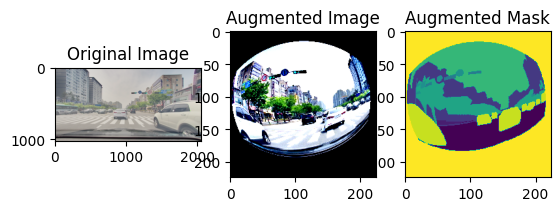

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


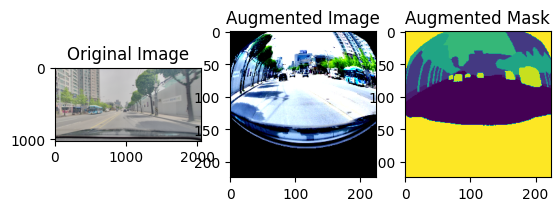

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


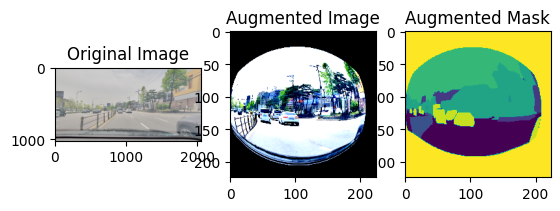

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


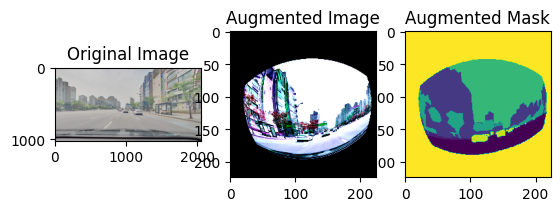

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


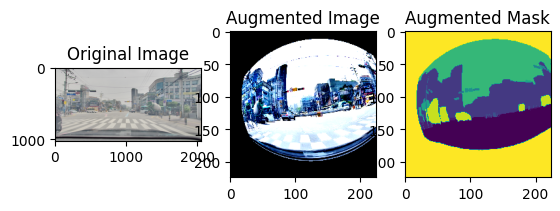

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


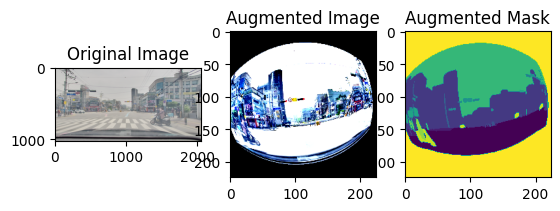

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


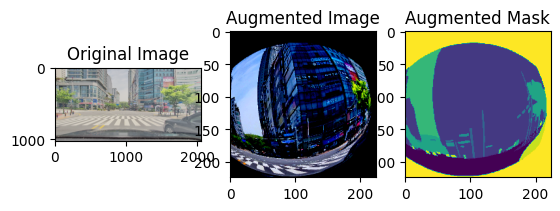

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


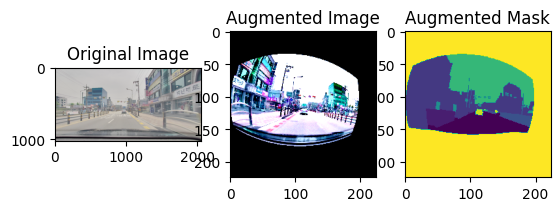

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


KeyboardInterrupt: 

In [8]:
#데이터 증강을 위한 transform 파이프라인 정의
transform = A.Compose(
    [
        
        A.RandomResizedCrop(540, 960,scale=(0.5, 1.0),ratio=(1, 1),p=0.9),  # 랜덤하게 자르기
        A.HorizontalFlip(p=0.5), #수평 뒤집기
        #A.Rotate(limit=30,p=0.5,border_mode=cv2.BORDER_CONSTANT, mask_value=(12)),
        A.ColorJitter(p=0.3),
        A.Resize(224, 224),
        A.ToGray(p=0.2),
        A.Normalize(),
        ToTensorV2()
    ]
)
dataset = CustomDataset(csv_file='./train_source.csv',infer=True) # dataset 불러오기

aug_dataset = CustomDataset(csv_file='./train_source.csv', transform=transform) # dataset 불러오기
for epoch in range(20): # 에폭
    epoch+=1
    model.train() # 학습 모드 설정
    epoch_loss = 0
    correct_pixels = 0
    total_pixels = 0



    image=dataset.__getitem__(epoch)
    aug_image,aug_mask=aug_dataset.__getitem__(epoch)
    #print(type(image),type(aug_image))
    #print(type(image.permute(1,2,0).numpy()))
    plt.figure()
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title('Original Image')
    plt.subplot(1, 3, 2)
    plt.imshow(aug_image.permute(1,2,0).numpy())
    plt.title('Augmented Image')
    plt.subplot(1, 3, 3)
    plt.imshow(aug_mask)
    plt.title('Augmented Mask')
    plt.show()
    


# Model save/load

In [9]:
save_dir = "./model_pth/new_unet_resnet50_bkg/"  # 모델 저장 디렉토리 설정
model_name = "trained_epoch{}.pth"  # 모델 파일 이름 패턴 설정


## Model Train

In [10]:
losses = []
accuracies = []
val_losses =[]
val_accuracies=[]

In [11]:

# training loop
for epoch in range(100):  # 20 에폭 동안 학습합니다.
    model.train()
    epoch_loss = 0
    correct_predictions = 0
    total_samples = 0

    for images, masks in tqdm(dataloader):
        
        images = images.float().to(device)
        masks = masks.long().to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks.squeeze(1))
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()
        
        # Calculate accuracy
        _, predicted = torch.max(outputs, 1)
        correct_predictions += (predicted == masks).sum().item()
        total_samples += masks.numel()
        

    # Validation loop
    model.eval()
    val_loss = 0
    val_correct_predictions = 0
    val_total_samples = 0
    with torch.no_grad():
        for val_images, val_masks in tqdm(val_dataloader):
            val_images = val_images.float().to(device)
            val_masks = val_masks.long().to(device)

            val_outputs = model(val_images)
            val_loss += criterion(val_outputs, val_masks.squeeze(1)).item()

            _, val_predicted = torch.max(val_outputs, 1)
            val_correct_predictions += (val_predicted == val_masks).sum().item()
            val_total_samples += val_masks.numel()

    #val loss ,accuracy 계산
    val_loss /= len(val_dataloader)
    val_accuracy = val_correct_predictions / val_total_samples
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)


    # 매 epoch마다 학습률을 업데이트합니다.
    scheduler.step()

    losses.append(epoch_loss / len(dataloader))
    #정확도 계산
    accuracy = correct_predictions / total_samples
    accuracies.append(accuracy)
    print(f'Epoch {epoch+1}, Loss: {epoch_loss/len(dataloader)}, Accuracy: {accuracy},Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}')

    # 각 에폭이 끝날 때마다 모델 저장
    save_path = save_dir + model_name.format(epoch+1)
    torch.save(model.state_dict(), save_path)
    print(f"Epoch {epoch+1} 모델 저장이 완료되었습니다.")

    # Plotting loss and accuracy curves in a single graph
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, len(losses) + 1),losses, label='Training Loss')
    plt.plot(range(1, len(accuracies) + 1),accuracies, label='Training Accuracy', color='orange')
    plt.plot(range(1, len(val_losses) + 1),val_losses, label='Validation Loss', linestyle='dashed')
    plt.plot(range(1, len(val_accuracies) + 1),val_accuracies, label='Validation Accuracy', color='orange', linestyle='dashed')
    
    plt.xlabel('Epoch')
    plt.ylabel('Value')
    plt.legend()
    plt.tight_layout()
    plt.show()

    
    # Early Stopping 체크
    # early_stopping(val_loss, model)
    
    # if early_stopping.early_stop:
    #     print("Early stopping")
    #     break

  0%|          | 0/138 [00:02<?, ?it/s]


KeyboardInterrupt: 

## Inference

최종 모델 불러와서 추론

모델 에폭 여러개 비교 코드

  0%|          | 0/119 [00:00<?, ?it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0


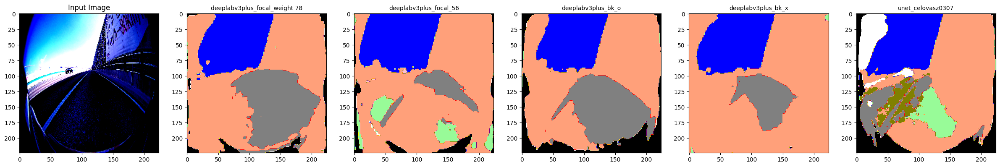

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1


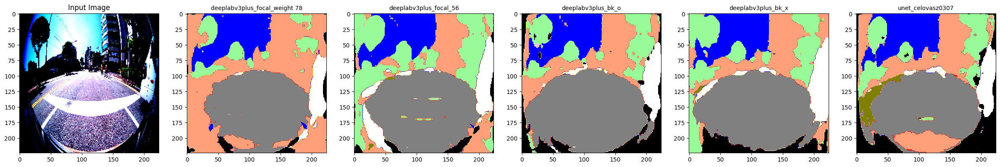

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2


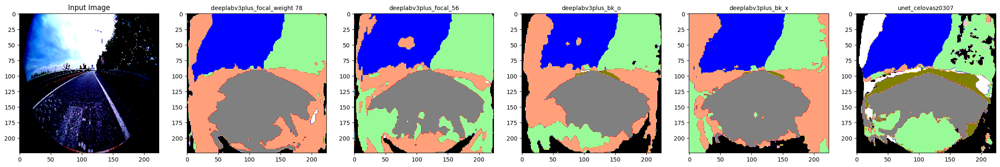

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


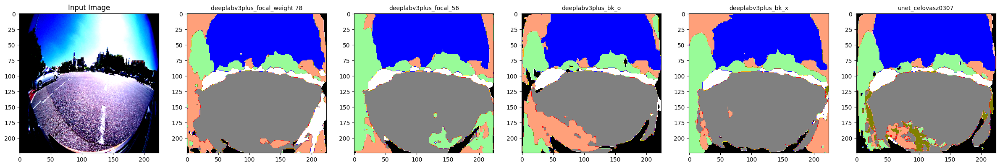

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4


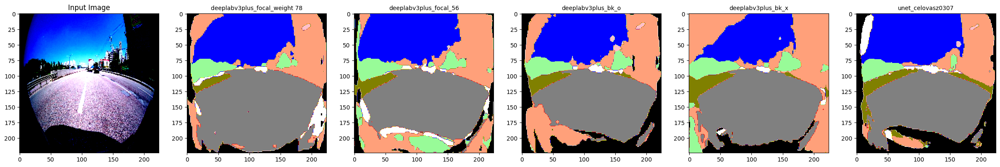

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5


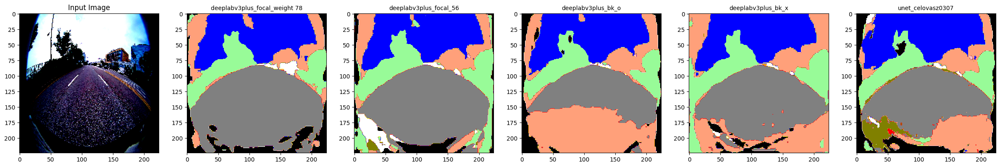

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6


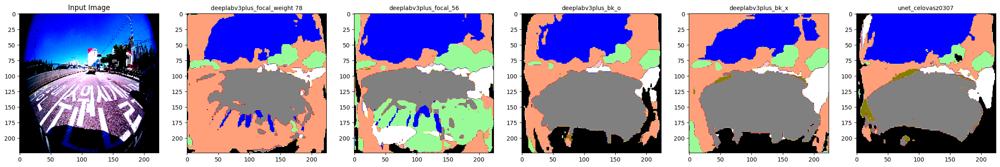

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7


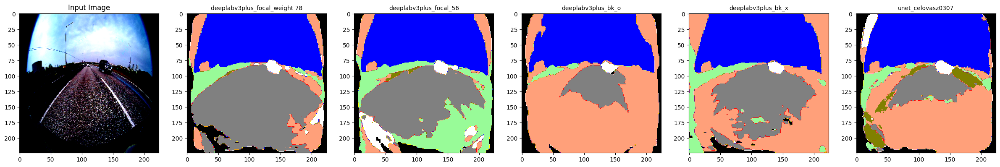

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8


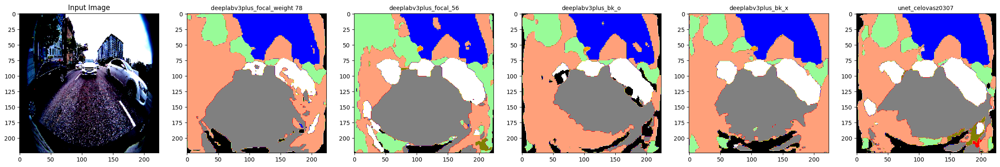

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9


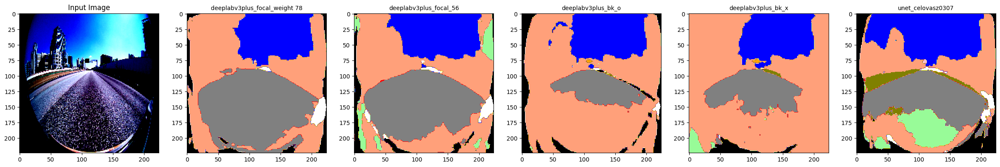

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10


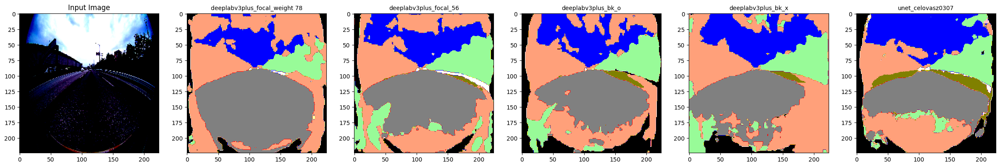

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


11


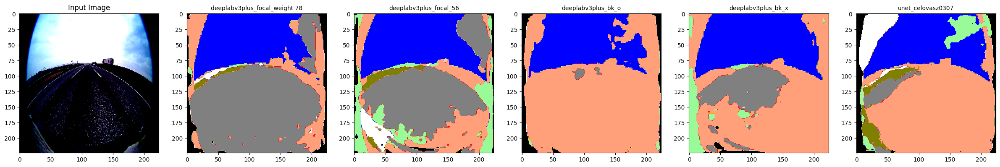

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


12


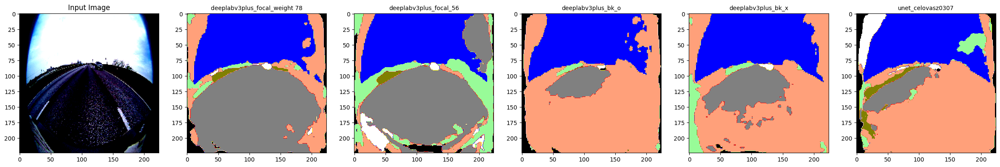

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


13


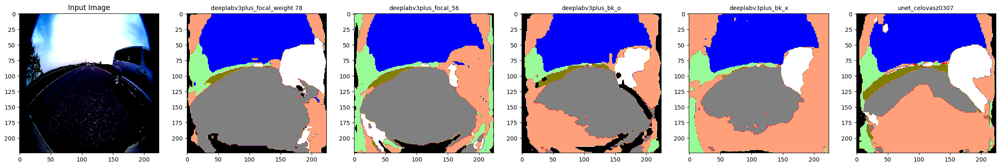

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


14


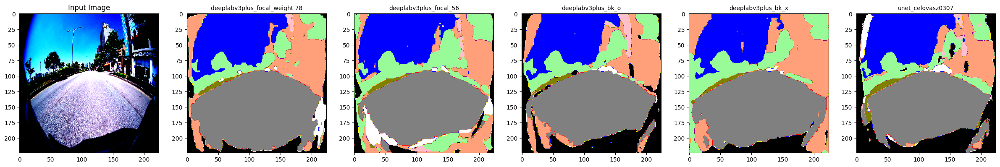

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


15


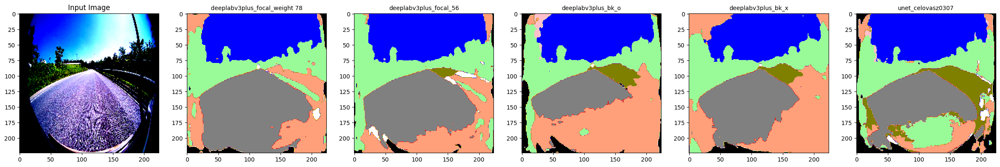

  1%|          | 1/119 [00:08<17:23,  8.84s/it]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0


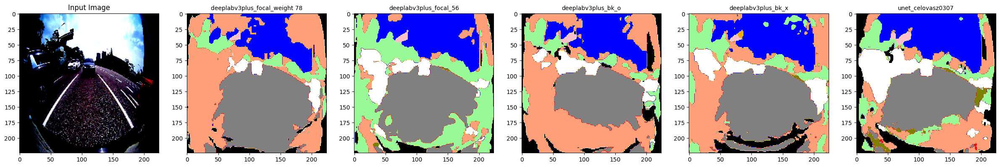

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1


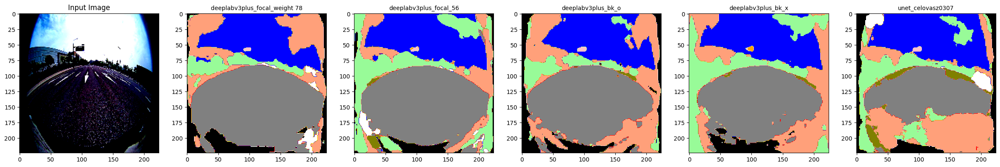

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2


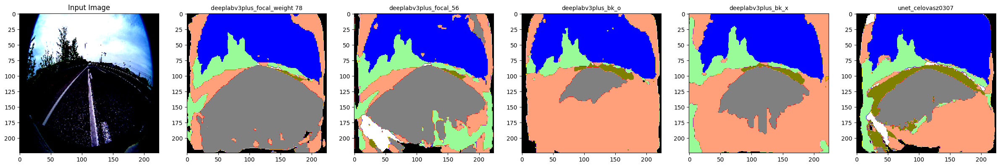

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


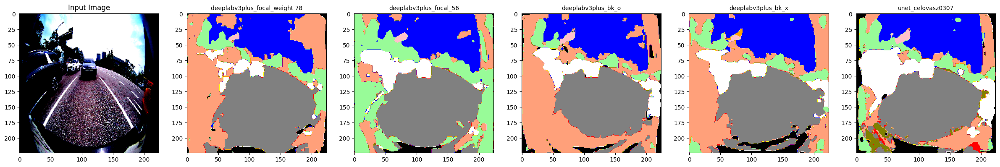

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4


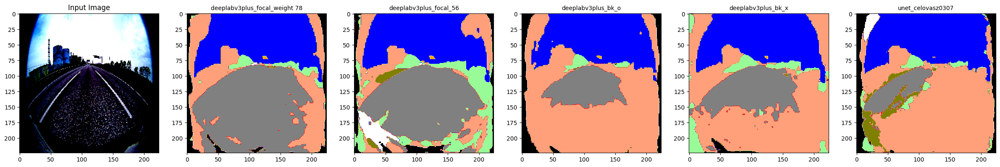

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5


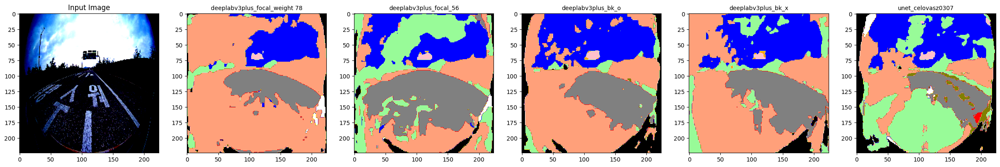

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6


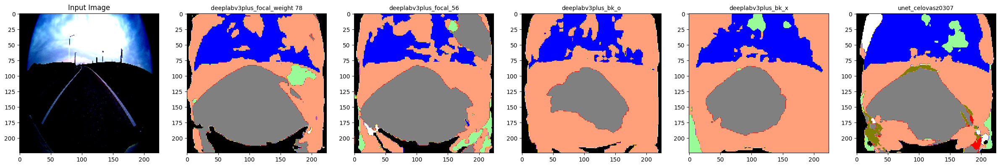

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7


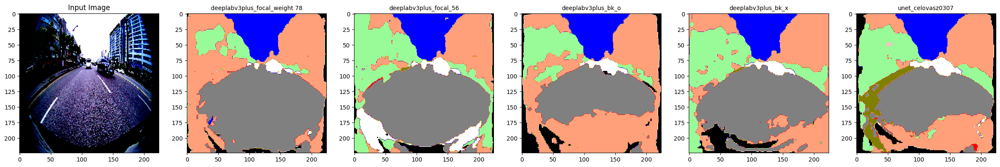

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8


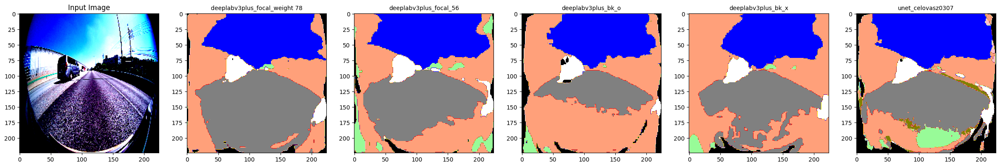

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9


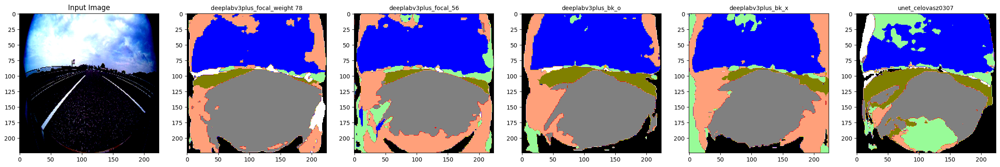

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10


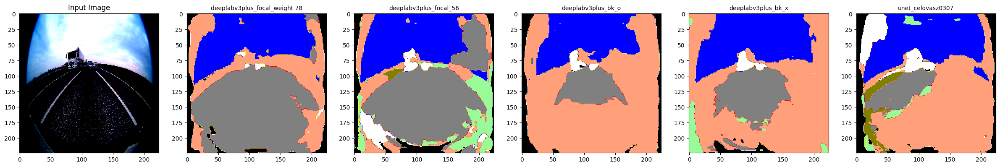

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


11


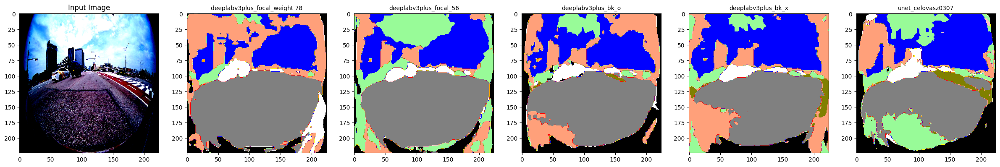

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


12


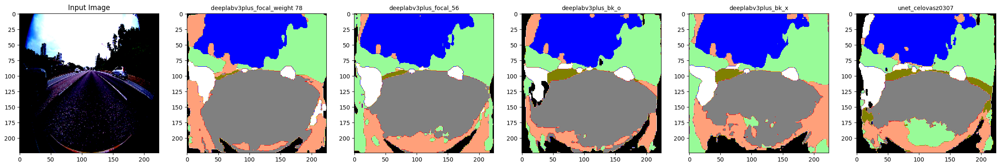

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


13


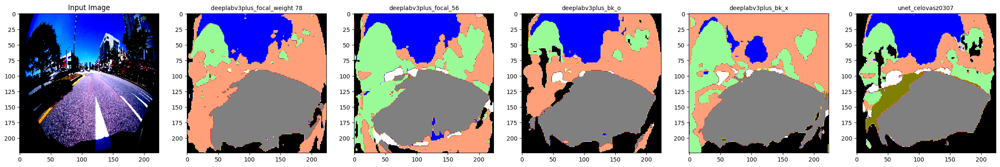

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  1%|          | 1/119 [00:16<33:25, 16.99s/it]

14


KeyboardInterrupt: 

In [23]:
import torch
import segmentation_models_pytorch as smp

model_path_list = [
'./model_pth/new_deeplabv3plus_resnet50_bkg_focal_weight/trained_epoch78.pth',
'./ensemble/new_deeplabv3plus_resnet50_bkg_re2_trained_epoch56.pth',
 './ensemble/new_deeplabv3plus_resnet50_bkg_trained_epoch100.pth',
 './ensemble/new_deeplabv3plus_resnet50_trained_epoch100.pth', 
 './ensemble/resnet50_unet_celovasz0307_trained_epoch75.pth']

ep_list=['deeplabv3plus_focal_weight 78',
         'deeplabv3plus_focal_56',
         'deeplabv3plus_bk_o',
         'deeplabv3plus_bk_x',
         'unet_celovasz0307']
models = []

for id,path in enumerate(model_path_list):
    # 불러올 모델의 정의
    if id<=3:
        model = smp.DeepLabV3Plus(encoder_name="resnet50",
                        in_channels=3,
                        classes=13,
                        encoder_weights="imagenet")
    else:
            model = smp.Unet(encoder_name="resnet50",
                    in_channels=3,
                    classes=13,
                    encoder_weights="imagenet")

    # 저장된 모델의 파라미터 불러오기 (strict=False 옵션 사용)
    state_dict = torch.load(path, map_location=torch.device('cpu'))

    # 모델의 파라미터 로드
    model.load_state_dict(state_dict, strict=False)

    # GPU 사용이 가능한 경우에는 GPU로 데이터 이동
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    
    models.append(model)  # 모델을 리스트에 추가

# 이제 models 리스트에는 로드된 모델들이 저장되어 있다.

from matplotlib.colors import ListedColormap
# 클래스별 색상 지정
class_colors = {
    0: 'gray',  
    1: 'red',
    2:'lightsalmon', # 연한 코랄
    3: 'olive',# 연한 보라
    4: 'purple',
    5: 'orange',
    6: 'pink',
    7: 'palegreen',# 연두색
    8: 'blue',
    9: 'yellow',
    10: 'brown',
    11: 'white',
    12: 'black'
}

# 컬러맵 생성
cmap = ListedColormap([class_colors[i] for i in range(13)])
import matplotlib.pyplot as plt

with torch.no_grad():
    result = []
    for images in tqdm(test_dataloader):
        images = images.float().to(device)
        images_cpu = images.cpu().numpy()  # 여러 이미지의 Tensor를 CPU로 옮긴 다음 Numpy 배열로 변환
        outputs_list=[]
        for model in models:

            model.eval()
        
            outputs = model(images)

            outputs = torch.softmax(outputs, dim=1).cpu()
            outputs = torch.argmax(outputs, dim=1).numpy()
            outputs_list.append(outputs)


        # batch에 존재하는 각 이미지에 대해서 반복
        for i, (pred1, pred2,pred3,pred4,pred5) in enumerate(zip(outputs_list[0], outputs_list[1],outputs_list[2],outputs_list[3],outputs_list[4])):
            print(i)
            pred1 = np.array(pred1).astype(np.uint8)
            pred2 = np.array(pred2).astype(np.uint8)
            pred3 = np.array(pred3).astype(np.uint8)
            pred4 = np.array(pred4).astype(np.uint8)
            pred5 = np.array(pred5).astype(np.uint8)

            pred1 = Image.fromarray(pred1)  # 이미지로 변환
            pred2 = Image.fromarray(pred2)  # 이미지로 변환
            pred3 = Image.fromarray(pred3)  # 이미지로 변환
            pred4 = Image.fromarray(pred4)  # 이미지로 변환
            pred5 = Image.fromarray(pred5)  # 이미지로 변환

            plt.figure(figsize=(30,10))
            plt.subplot(1, len(outputs_list) + 1, 1)
            plt.imshow(np.transpose(images_cpu[i], (1, 2, 0)))  # 이미지의 채널 순서 변경
            plt.title("Input Image")

            for j, (pred, ep) in enumerate(zip([pred1, pred2 ,pred3,pred4,pred5], ep_list)):
                plt.subplot(1, len(outputs_list) + 1, j + 2)
                plt.imshow(pred, cmap=cmap)
                plt.title(ep,fontsize=10)

            plt.show()


In [ ]:
import torch
import segmentation_models_pytorch as smp

model_path_list = [
'./model_pth/new_deeplabv3plus_resnet50_bkg_focal_weight/trained_epoch78.pth',
'./ensemble/new_deeplabv3plus_resnet50_bkg_re2_trained_epoch56.pth',
 './ensemble/new_deeplabv3plus_resnet50_bkg_trained_epoch100.pth',
 './ensemble/new_deeplabv3plus_resnet50_trained_epoch100.pth', 
 './ensemble/resnet50_unet_celovasz0307_trained_epoch75.pth']

ep_list=['deeplabv3plus_focal_weight 78',
         'deeplabv3plus_focal_56',
         'deeplabv3plus_bk_o',
         'deeplabv3plus_bk_x',
         'unet_celovasz0307','다중합 ensemble']
models = []

for id,path in enumerate(model_path_list):
    # 불러올 모델의 정의
    if id<=3:
        model = smp.DeepLabV3Plus(encoder_name="resnet50",
                        in_channels=3,
                        classes=13,
                        encoder_weights="imagenet")
    else:
            model = smp.Unet(encoder_name="resnet50",
                    in_channels=3,
                    classes=13,
                    encoder_weights="imagenet")

    # 저장된 모델의 파라미터 불러오기 (strict=False 옵션 사용)
    state_dict = torch.load(path, map_location=torch.device('cpu'))

    # 모델의 파라미터 로드
    model.load_state_dict(state_dict, strict=False)

    # GPU 사용이 가능한 경우에는 GPU로 데이터 이동
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    
    models.append(model)  # 모델을 리스트에 추가

# 이제 models 리스트에는 로드된 모델들이 저장되어 있다.

from matplotlib.colors import ListedColormap
# 클래스별 색상 지정
class_colors = {
    0: 'gray',  
    1: 'red',
    2:'lightsalmon', # 연한 코랄
    3: 'olive',# 연한 보라
    4: 'purple',
    5: 'orange',
    6: 'pink',
    7: 'palegreen',# 연두색
    8: 'blue',
    9: 'yellow',
    10: 'brown',
    11: 'white',
    12: 'black'
}

# 컬러맵 생성
cmap = ListedColormap([class_colors[i] for i in range(13)])
import matplotlib.pyplot as plt
# 앙상블 예측 함수 정의
def ensemble_predictions(outputs_list):
    num_models = len(outputs_list)
    ensemble_probs = np.zeros_like(outputs_list[0].cpu().numpy(), dtype=float)  # CPU로 이동하여 NumPy 배열 생성

    for outputs in outputs_list:
        # 모델 출력을 CPU로 이동시키고 NumPy로 변환합니다.
        outputs = outputs.cpu().numpy()
        # 확률로 변환하고 numpy 배열로 가져옵니다.
        probs = torch.softmax(torch.from_numpy(outputs), dim=1).cpu().numpy()
        ensemble_probs += probs / num_models  # 각 모델의 예측을 더합니다.

    ensemble_predictions = np.argmax(ensemble_probs, axis=1)
    return ensemble_predictions



with torch.no_grad():
    result = []
    for images in tqdm(test_dataloader):
        images = images.float().to(device)
        images_cpu = images.cpu().numpy()  # 여러 이미지의 Tensor를 CPU로 옮긴 다음 Numpy 배열로 변환
        outputs_list=[]
        inputs_ensemble_list=[] #ensemble할 모델 출력 저장
        for model in models:

            model.eval()
            outputs = model(images)
            inputs_ensemble_list.append(outputs)
            outputs = torch.softmax(outputs, dim=1).cpu()
            outputs = torch.argmax(outputs, dim=1).numpy()
            outputs_list.append(outputs)

        # 앙상블 예측 수행
        ensemble_pred = ensemble_predictions(inputs_ensemble_list)
        
        # batch에 존재하는 각 이미지에 대해서 반복
        for i, (pred1, pred2,pred3,pred4,pred5,ensemble_pred) in enumerate(zip(outputs_list[0], outputs_list[1],outputs_list[2],outputs_list[3],outputs_list[4],ensemble_pred)):
            print(i)
            pred1 = np.array(pred1).astype(np.uint8)
            pred2 = np.array(pred2).astype(np.uint8)
            pred3 = np.array(pred3).astype(np.uint8)
            pred4 = np.array(pred4).astype(np.uint8)
            pred5 = np.array(pred5).astype(np.uint8)
            ensemble_pred =  np.array(ensemble_pred).astype(np.uint8)

            pred1 = Image.fromarray(pred1)  # 이미지로 변환
            pred2 = Image.fromarray(pred2)  # 이미지로 변환
            pred3 = Image.fromarray(pred3)  # 이미지로 변환
            pred4 = Image.fromarray(pred4)  # 이미지로 변환
            pred5 = Image.fromarray(pred5)  # 이미지로 변환
            ensemble_pred = Image.fromarray(ensemble_pred)

            plt.figure(figsize=(30,10))
            plt.subplot(1, len(outputs_list) + 2, 1)
            plt.imshow(np.transpose(images_cpu[i], (1, 2, 0)))  # 이미지의 채널 순서 변경
            plt.title("Input Image")

            for j, (pred, ep) in enumerate(zip([pred1, pred2 ,pred3,pred4,pred5,ensemble_pred], ep_list)):
                plt.subplot(1, len(outputs_list) + 2, j + 2)
                plt.imshow(pred, cmap=cmap)
                plt.title(ep,fontsize=10)

            plt.show()


  0%|          | 0/119 [00:00<?, ?it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0


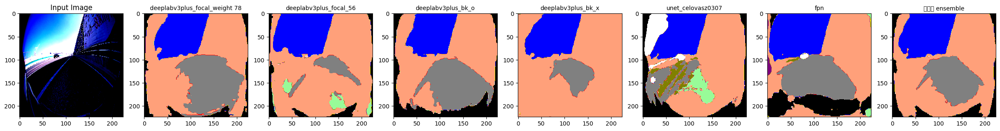

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1


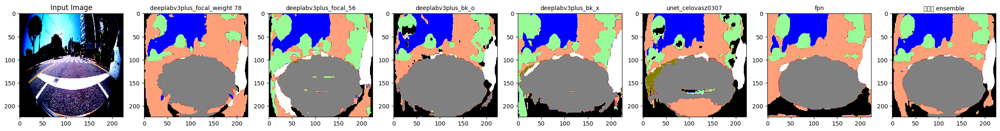

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2


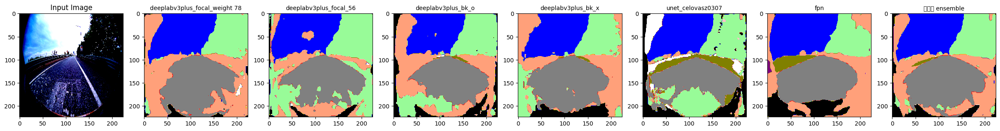

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


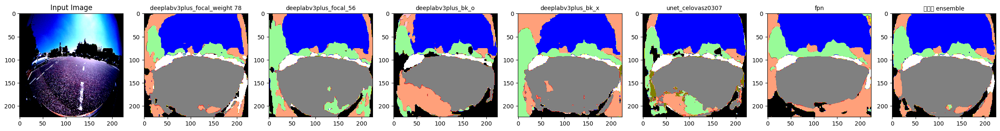

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4


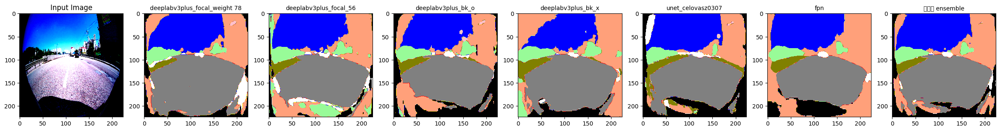

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5


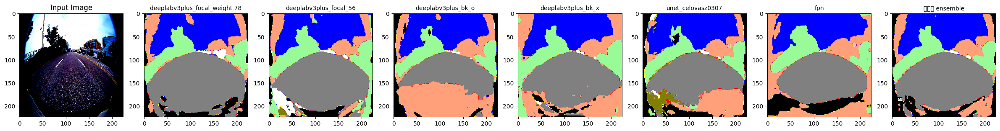

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6


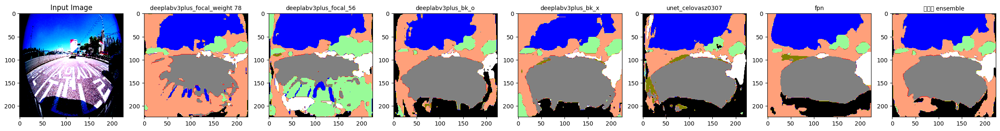

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7


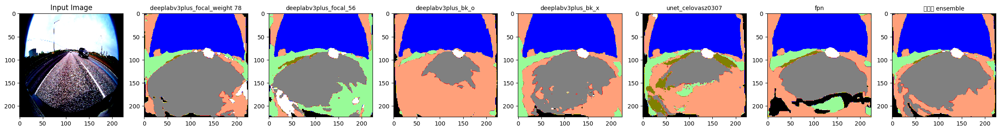

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8


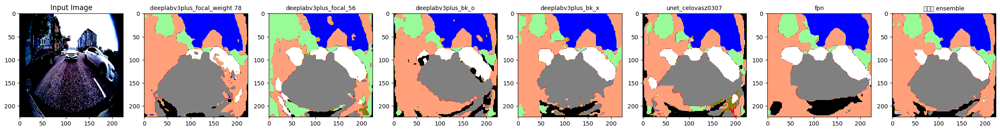

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9


  0%|          | 0/119 [00:06<?, ?it/s]


KeyboardInterrupt: 

In [24]:
import torch
import segmentation_models_pytorch as smp

model_path_list = [
'./model_pth/new_deeplabv3plus_resnet50_bkg_focal_weight/trained_epoch78.pth',
'./ensemble/new_deeplabv3plus_resnet50_bkg_re2_trained_epoch56.pth',
 './ensemble/new_deeplabv3plus_resnet50_bkg_trained_epoch100.pth',
 './ensemble/new_deeplabv3plus_resnet50_trained_epoch100.pth', 
 './ensemble/resnet50_unet_celovasz0307_trained_epoch75.pth',
 './ensemble/fpn_trained_epoch18.pth']
#'./ensemble/resnet50_unet_celovasz0307_trained_epoch75.pth'

ep_list=['deeplabv3plus_focal_weight 78',
         'deeplabv3plus_focal_56',
         'deeplabv3plus_bk_o',
         'deeplabv3plus_bk_x','unet_celovasz0307',
         'fpn','다중합 ensemble']
models = []

for id,path in enumerate(model_path_list):
    # 불러올 모델의 정의
    if id<=3:
        model = smp.DeepLabV3Plus(encoder_name="resnet50",
                        in_channels=3,
                        classes=13,
                        encoder_weights="imagenet")
    elif id==4:
        model = smp.Unet(encoder_name="resnet50",
                in_channels=3,
                classes=13,
                encoder_weights="imagenet")
    else:
        model = smp.FPN(encoder_name="resnet101",
        in_channels=3,
        classes=13,
        encoder_weights="imagenet")

    # 저장된 모델의 파라미터 불러오기 (strict=False 옵션 사용)
    state_dict = torch.load(path, map_location=torch.device('cpu'))

    # 모델의 파라미터 로드
    model.load_state_dict(state_dict, strict=False)

    # GPU 사용이 가능한 경우에는 GPU로 데이터 이동
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    
    models.append(model)  # 모델을 리스트에 추가

# 이제 models 리스트에는 로드된 모델들이 저장되어 있다.

from matplotlib.colors import ListedColormap
# 클래스별 색상 지정
class_colors = {
    0: 'gray',  
    1: 'red',
    2:'lightsalmon', # 연한 코랄
    3: 'olive',# 연한 보라
    4: 'purple',
    5: 'orange',
    6: 'pink',
    7: 'palegreen',# 연두색
    8: 'blue',
    9: 'yellow',
    10: 'brown',
    11: 'white',
    12: 'black'
}

# 컬러맵 생성
cmap = ListedColormap([class_colors[i] for i in range(13)])
import matplotlib.pyplot as plt
# 앙상블 예측 함수 정의
# 앙상블 예측 함수 정의
def ensemble_predictions(outputs_list, model_weights):
    num_models = len(outputs_list)
    ensemble_probs = np.zeros_like(outputs_list[0].cpu().numpy(), dtype=float)

    for outputs, weight in zip(outputs_list, model_weights):
        outputs = outputs.cpu().numpy()
        probs = torch.softmax(torch.from_numpy(outputs), dim=1).cpu().numpy()
        ensemble_probs += weight * probs

    ensemble_predictions = np.argmax(ensemble_probs, axis=1)
    return ensemble_predictions

model_weights = [0.5, 0.2, 0.2, 0.2, 0.2, 0.2]  # 각 모델에 대한 가중치 설정

with torch.no_grad():
    result = []
    for images in tqdm(test_dataloader):
        images = images.float().to(device)
        images_cpu = images.cpu().numpy()  # 여러 이미지의 Tensor를 CPU로 옮긴 다음 Numpy 배열로 변환
        outputs_list=[]
        inputs_ensemble_list=[] #ensemble할 모델 출력 저장
        for model in models:

            model.eval()
            outputs = model(images)
            inputs_ensemble_list.append(outputs)
            outputs = torch.softmax(outputs, dim=1).cpu()
            outputs = torch.argmax(outputs, dim=1).numpy()
            outputs_list.append(outputs)

        # 앙상블 예측 수행
        ensemble_pred = ensemble_predictions(inputs_ensemble_list, model_weights)
        
        # batch에 존재하는 각 이미지에 대해서 반복
        for i, (pred1, pred2,pred3,pred4,pred5,pred6,ensemble_pred) in enumerate(zip(outputs_list[0], outputs_list[1],outputs_list[2],outputs_list[3],outputs_list[4],outputs_list[5],ensemble_pred)):
            print(i)
            pred1 = np.array(pred1).astype(np.uint8)
            pred2 = np.array(pred2).astype(np.uint8)
            pred3 = np.array(pred3).astype(np.uint8)
            pred4 = np.array(pred4).astype(np.uint8)
            pred5 = np.array(pred5).astype(np.uint8)
            pred6 = np.array(pred6).astype(np.uint8)            
            ensemble_pred =  np.array(ensemble_pred).astype(np.uint8)

            pred1 = Image.fromarray(pred1)  # 이미지로 변환
            pred2 = Image.fromarray(pred2)  # 이미지로 변환
            pred3 = Image.fromarray(pred3)  # 이미지로 변환
            pred4 = Image.fromarray(pred4)  # 이미지로 변환
            pred5 = Image.fromarray(pred5)  # 이미지로 변환
            pred6 = Image.fromarray(pred6)  # 이미지로 변환
            ensemble_pred = Image.fromarray(ensemble_pred)

            plt.figure(figsize=(30,10))
            plt.subplot(1, len(outputs_list) + 2, 1)
            plt.imshow(np.transpose(images_cpu[i], (1, 2, 0)))  # 이미지의 채널 순서 변경
            plt.title("Input Image")

            for j, (pred, ep) in enumerate(zip([pred1, pred2 ,pred3,pred4,pred5,pred6,ensemble_pred], ep_list)):
                plt.subplot(1, len(outputs_list) + 2, j + 2)
                plt.imshow(pred, cmap=cmap)
                plt.title(ep,fontsize=10)

            plt.show()





emsemble 추론

In [20]:
import torch
import segmentation_models_pytorch as smp

model_path_list = [
'./model_pth/new_deeplabv3plus_resnet50_bkg_focal_weight/trained_epoch78.pth',
'./ensemble/new_deeplabv3plus_resnet50_bkg_re2_trained_epoch56.pth',
 './ensemble/new_deeplabv3plus_resnet50_bkg_trained_epoch100.pth',
 './ensemble/new_deeplabv3plus_resnet50_trained_epoch100.pth', 
 './ensemble/resnet50_unet_celovasz0307_trained_epoch75.pth',
 './ensemble/fpn_trained_epoch18.pth']
#'./ensemble/resnet50_unet_celovasz0307_trained_epoch75.pth'

ep_list=['deeplabv3plus_focal_weight 78',
         'deeplabv3plus_focal_56',
         'deeplabv3plus_bk_o',
         'deeplabv3plus_bk_x','unet_celovasz0307',
         'fpn','다중합 ensemble']
models = []

for id,path in enumerate(model_path_list):
    # 불러올 모델의 정의
    if id<=3:
        model = smp.DeepLabV3Plus(encoder_name="resnet50",
                        in_channels=3,
                        classes=13,
                        encoder_weights="imagenet")
    elif id==4:
        model = smp.Unet(encoder_name="resnet50",
                in_channels=3,
                classes=13,
                encoder_weights="imagenet")
    else:
        model = smp.FPN(encoder_name="resnet101",
        in_channels=3,
        classes=13,
        encoder_weights="imagenet")

    # 저장된 모델의 파라미터 불러오기 (strict=False 옵션 사용)
    state_dict = torch.load(path, map_location=torch.device('cpu'))

    # 모델의 파라미터 로드
    model.load_state_dict(state_dict, strict=False)

    # GPU 사용이 가능한 경우에는 GPU로 데이터 이동
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    
    models.append(model)  # 모델을 리스트에 추가

# 이제 models 리스트에는 로드된 모델들이 저장되어 있다.

from matplotlib.colors import ListedColormap
# 클래스별 색상 지정
class_colors = {
    0: 'gray',  
    1: 'red',
    2:'lightsalmon', # 연한 코랄
    3: 'olive',# 연한 보라
    4: 'purple',
    5: 'orange',
    6: 'pink',
    7: 'palegreen',# 연두색
    8: 'blue',
    9: 'yellow',
    10: 'brown',
    11: 'white',
    12: 'black'
}

# 컬러맵 생성
cmap = ListedColormap([class_colors[i] for i in range(13)])
import matplotlib.pyplot as plt
# 앙상블 예측 함수 정의
# 앙상블 예측 함수 정의
def ensemble_predictions(outputs_list, model_weights):
    num_models = len(outputs_list)
    ensemble_probs = np.zeros_like(outputs_list[0].cpu().numpy(), dtype=float)

    for outputs, weight in zip(outputs_list, model_weights):
        outputs = outputs.cpu().numpy()
        probs = torch.softmax(torch.from_numpy(outputs), dim=1).cpu().numpy()
        ensemble_probs += weight * probs

    ensemble_predictions = np.argmax(ensemble_probs, axis=1)
    return ensemble_predictions

model_weights = [0.5, 0.2, 0.2, 0.2, 0.2, 0.2]  # 각 모델에 대한 가중치 설정

with torch.no_grad():
    result = []
    for images in tqdm(test_dataloader):
        images = images.float().to(device)
        images_cpu = images.cpu().numpy()  # 여러 이미지의 Tensor를 CPU로 옮긴 다음 Numpy 배열로 변환
        outputs_list=[]
        inputs_ensemble_list=[] #ensemble할 모델 출력 저장
        for model in models:

            model.eval()
            outputs = model(images)
            inputs_ensemble_list.append(outputs)
            outputs = torch.softmax(outputs, dim=1).cpu()
            outputs = torch.argmax(outputs, dim=1).numpy()
            outputs_list.append(outputs)

        # 앙상블 예측 수행
        ensemble_pred = ensemble_predictions(inputs_ensemble_list, model_weights)
        
        # batch에 존재하는 각 이미지에 대해서 반복
        for pred in ensemble_pred:
            pred = pred.astype(np.uint8)
            pred = Image.fromarray(pred) # 이미지로 변환
            pred = pred.resize((960, 540), Image.NEAREST) # 960 x 540 사이즈로 변환
            pred = np.array(pred) # 다시 수치로 변환
            # class 0 ~ 11에 해당하는 경우에 마스크 형성 / 12(배경)는 제외하고 진행
            for class_id in range(12):
                class_mask = (pred == class_id).astype(np.uint8)
                if np.sum(class_mask) > 0: # 마스크가 존재하는 경우 encode
                    mask_rle = rle_encode(class_mask)
                    result.append(mask_rle)
                else: # 마스크가 존재하지 않는 경우 -1
                    result.append(-1)            


100%|██████████| 119/119 [04:43<00:00,  2.38s/it]


In [90]:
# #불러올 모델의 정의
# model1 = smp.Unet(encoder_name="resnet50",  # 필수 파라미터: 사용할 인코더 백본의 이름
#     in_channels=3,    # 필수 파라미터: 입력 이미지의 채널 수 (일반적으로 3(RGB) 또는 1(Grayscale))
#     classes=13,        # 필수 파라미터: 세그멘테이션 클래스의 수 (예: 물체 탐지의 경우 물체 클래스 수)
#     encoder_weights="imagenet"  # 선택적 파라미터: 사용할 사전 훈련된 인코더 가중치의 경로 또는 'imagenet'으로 설정하여 ImageNet 가중치 사용
# )
# # 저장된 모델의 파라미터 불러오기 (strict=False 옵션 사용)
# state_dict = torch.load('./model_pth/resnet50_unet_fish_crop_aug2/trained_epoch63.pth', map_location=torch.device('cpu'))

# # 모델의 파라미터 로드
# model1.load_state_dict(state_dict, strict=False)

# # GPU 사용이 가능한 경우에는 GPU로 데이터 이동
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# model1.to(device)

#불러올 모델의 정의
model = smp.DeepLabV3Plus(encoder_name="resnet50",  # 필수 파라미터: 사용할 인코더 백본의 이름
    in_channels=3,    # 필수 파라미터: 입력 이미지의 채널 수 (일반적으로 3(RGB) 또는 1(Grayscale))
    classes=13,        # 필수 파라미터: 세그멘테이션 클래스의 수 (예: 물체 탐지의 경우 물체 클래스 수)
    encoder_weights="imagenet"  # 선택적 파라미터: 사용할 사전 훈련된 인코더 가중치의 경로 또는 'imagenet'으로 설정하여 ImageNet 가중치 사용
)
# 저장된 모델의 파라미터 불러오기 (strict=False 옵션 사용)
state_dict = torch.load('./model_pth/new_deeplabv3plus_resnet50_bkg_focal_weight/trained_epoch78.pth', map_location=torch.device('cpu'))

# 모델의 파라미터 로드
model.load_state_dict(state_dict, strict=False)

# GPU 사용이 가능한 경우에는 GPU로 데이터 이동
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

DeepLabV3Plus(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequentia

In [18]:
transform = A.Compose(
    [   
        A.RandomBrightness(p=1.0,limit=(-0.1, 0.0)),
        A.Resize(224, 224),
        A.Normalize(),
        ToTensorV2()
    ]
)

In [19]:
test_dataset = CustomDataset(csv_file='./test.csv', transform=transform, infer=True)
test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False)

val_dataset = CustomDataset(csv_file='./val_source.csv', transform=transform, infer=False)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False)

train_target_dataset = CustomDataset(csv_file='./train_target.csv', transform=transform, infer=True)
train_target_dataloader = DataLoader(train_target_dataset, batch_size=16, shuffle=False)


원본 inference

In [97]:
with torch.no_grad():
    model.eval()
    result = []
    for images in tqdm(test_dataloader):
        images = images.float().to(device)
        outputs = model(images)
        outputs = torch.softmax(outputs, dim=1).cpu()
        outputs = torch.argmax(outputs, dim=1).numpy()
        # batch에 존재하는 각 이미지에 대해서 반복
        for pred in outputs:
            pred = pred.astype(np.uint8)
            pred = Image.fromarray(pred) # 이미지로 변환
            pred = pred.resize((960, 540), Image.NEAREST) # 960 x 540 사이즈로 변환
            pred = np.array(pred) # 다시 수치로 변환
            # class 0 ~ 11에 해당하는 경우에 마스크 형성 / 12(배경)는 제외하고 진행
            for class_id in range(12):
                class_mask = (pred == class_id).astype(np.uint8)
                if np.sum(class_mask) > 0: # 마스크가 존재하는 경우 encode
                    mask_rle = rle_encode(class_mask)
                    result.append(mask_rle)
                else: # 마스크가 존재하지 않는 경우 -1
                    result.append(-1)

100%|██████████| 119/119 [02:47<00:00,  1.41s/it]


test dataset inference

두개 모델 추론 비교

In [ ]:

from matplotlib.colors import ListedColormap
# 클래스별 색상 지정
class_colors = {
    0: 'gray',  
    1: 'red',
    2:'lightsalmon', # 연한 코랄
    3: 'olive',# 연한 보라
    4: 'purple',
    5: 'orange',
    6: 'pink',
    7: 'palegreen',# 연두색
    8: 'blue',
    9: 'yellow',
    10: 'brown',
    11: 'white',
    12: 'black'
}

# 컬러맵 생성
cmap = ListedColormap([class_colors[i] for i in range(13)])
import matplotlib.pyplot as plt
with torch.no_grad():
    model.eval()
    model1.eval()
    result = []
    for images in tqdm(test_dataloader):
        images = images.float().to(device)
        outputs = model(images)
        outputs1 = model1(images)
        outputs = torch.softmax(outputs, dim=1).cpu()
        outputs = torch.argmax(outputs, dim=1).numpy()
        outputs1 = torch.softmax(outputs1, dim=1).cpu()
        outputs1 = torch.argmax(outputs1, dim=1).numpy()

        images_cpu = images.cpu().numpy()  # 여러 이미지의 Tensor를 CPU로 옮긴 다음 Numpy 배열로 변환
        # batch에 존재하는 각 이미지에 대해서 반복
        for i , (pred , pred1) in enumerate(zip(outputs , outputs1)):
            pred = pred.astype(np.uint8)
            pred = Image.fromarray(pred) # 이미지로 변환
            #pred = pred.resize((960, 540), Image.NEAREST) # 960 x 540 사이즈로 변환
            pred = np.array(pred) # 다시 수치로 변환

            pred1 = pred1.astype(np.uint8)
            pred1 = Image.fromarray(pred1) # 이미지로 변환
            #pred1 = pred1.resize((960, 540), Image.NEAREST) # 960 x 540 사이즈로 변환
            pred1 = np.array(pred1) # 다시 수치로 변환
            # class 0 ~ 11에 해당하는 경우에 마스크 형성 / 12(배경)는 제외하고 진행
            for  class_id in range(12):
                class_mask = (pred == class_id).astype(np.uint8)
                class_mask = (pred1 == class_id).astype(np.uint8)
                # if np.sum(class_mask) > 0: # 마스크가 존재하는 경우 encode
                #     mask_rle = rle_encode(class_mask)
                #     result.append(mask_rle)
                # else: # 마스크가 존재하지 않는 경우 -1
                #     result.append(-1)

            plt.figure(figsize=(15,10))
            plt.subplot(1, 3, 1)
            plt.imshow(np.transpose(images_cpu[i], (1, 2, 0)))  # 이미지의 채널 순서 변경
            plt.title("Input Image")

            plt.subplot(1, 3, 2)
            plt.imshow(pred, cmap=cmap)
            plt.title("color jitter= 0.5 l2=0.0005 ep52 Predicted Mask")

            plt.subplot(1, 3, 3)
            plt.imshow(pred1, cmap=cmap)
            plt.title("color jitter= 0.5 l2=0.0005 ep38 Predicted Mask")

            plt.show()
            
                

한개추론

In [ ]:
import matplotlib.pyplot as plt
with torch.no_grad():
    model.eval()
    result = []
    for images in tqdm(test_dataloader):
        images = images.float().to(device)
        outputs = model(images)
        outputs = torch.softmax(outputs, dim=1).cpu()
        outputs = torch.argmax(outputs, dim=1).numpy()

        images_cpu = images.cpu().numpy()  # 여러 이미지의 Tensor를 CPU로 옮긴 다음 Numpy 배열로 변환
        # batch에 존재하는 각 이미지에 대해서 반복
        for i,pred in enumerate(outputs):
            pred = pred.astype(np.uint8)
            pred = Image.fromarray(pred) # 이미지로 변환
            #pred = pred.resize((960, 540), Image.NEAREST) # 960 x 540 사이즈로 변환
            pred = np.array(pred) # 다시 수치로 변환
            # class 0 ~ 11에 해당하는 경우에 마스크 형성 / 12(배경)는 제외하고 진행
            for  class_id in range(12):
                class_mask = (pred == class_id).astype(np.uint8)
                if np.sum(class_mask) > 0: # 마스크가 존재하는 경우 encode
                    mask_rle = rle_encode(class_mask)
                    result.append(mask_rle)
                else: # 마스크가 존재하지 않는 경우 -1
                    result.append(-1)
            plt.figure(figsize=(10,5))
            plt.subplot(1, 2, 1)
            plt.imshow(np.transpose(images_cpu[i], (1, 2, 0)))  # 이미지의 채널 순서 변경
            plt.title("Input Image")

            plt.subplot(1, 2, 2)
            plt.imshow(pred, cmap='gray')
            plt.title("Predicted Mask")

            plt.show()
            
                

train target datasets inference

In [ ]:
import matplotlib.pyplot as plt
with torch.no_grad():
    model.eval()
    result = []
    for images in tqdm(train_target_dataloader):
        images = images.float().to(device)
        outputs = model(images)
        outputs = torch.softmax(outputs, dim=1).cpu()
        outputs = torch.argmax(outputs, dim=1).numpy()

        images_cpu = images.cpu().numpy()  # 여러 이미지의 Tensor를 CPU로 옮긴 다음 Numpy 배열로 변환
        # batch에 존재하는 각 이미지에 대해서 반복
        for i,pred in enumerate(outputs):
            pred = pred.astype(np.uint8)
            pred = Image.fromarray(pred) # 이미지로 변환
            pred = pred.resize((960, 540), Image.NEAREST) # 960 x 540 사이즈로 변환
            pred = np.array(pred) # 다시 수치로 변환
            # class 0 ~ 11에 해당하는 경우에 마스크 형성 / 12(배경)는 제외하고 진행
            for  class_id in range(12):
                class_mask = (pred == class_id).astype(np.uint8)
                if np.sum(class_mask) > 0: # 마스크가 존재하는 경우 encode
                    mask_rle = rle_encode(class_mask)
                    result.append(mask_rle)
                else: # 마스크가 존재하지 않는 경우 -1
                    result.append(-1)
            plt.figure(figsize=(10,5))
            plt.subplot(1, 2, 1)
            plt.imshow(np.transpose(images_cpu[i], (1, 2, 0)))  # 이미지의 채널 순서 변경
            plt.title("Input Image")

            plt.subplot(1, 2, 2)
            plt.imshow(pred, cmap='gray')
            plt.title("Predicted Mask")

            plt.show()
            
                

val datasets inference

  0%|          | 0/30 [00:00<?, ?it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


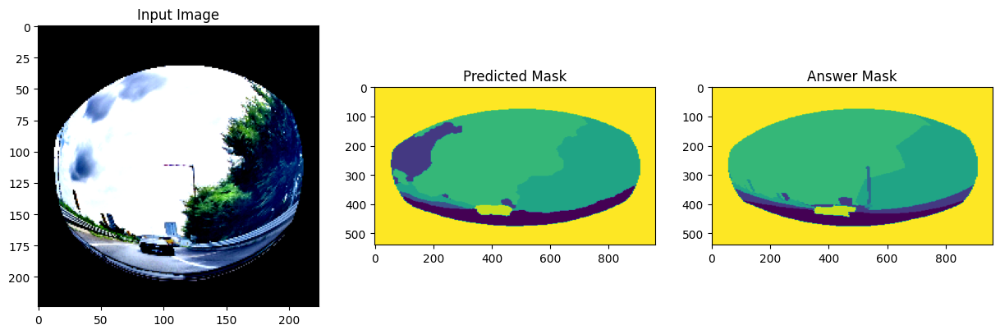

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


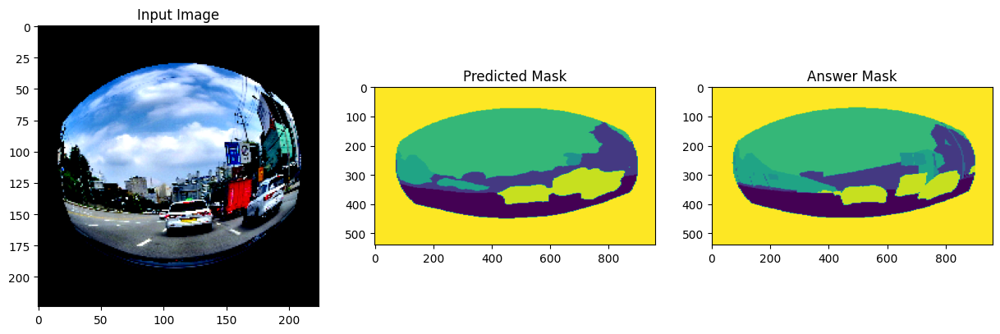

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


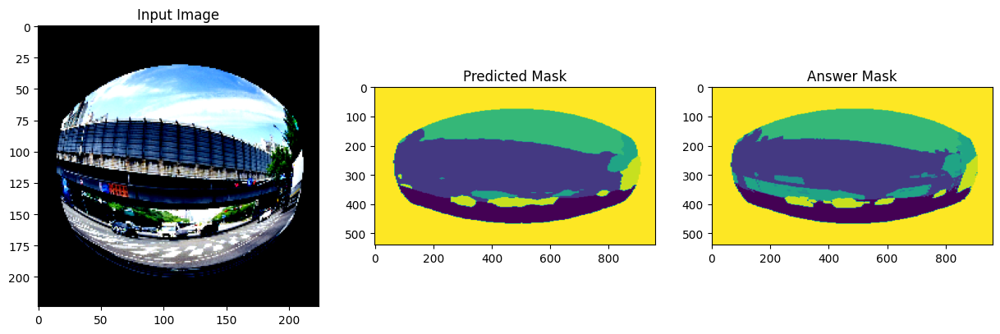

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


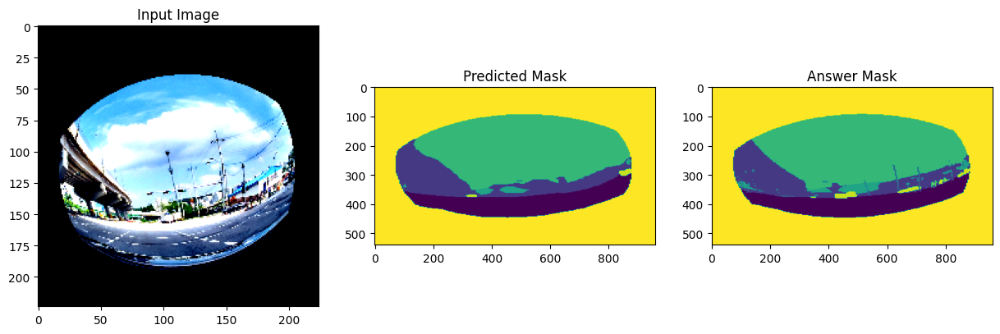

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  0%|          | 0/30 [00:06<?, ?it/s]


KeyboardInterrupt: 

In [93]:
import matplotlib.pyplot as plt
with torch.no_grad():
    model.eval()
    result = []
    for images , masks in tqdm(val_dataloader):
        images = images.float().to(device)
        outputs = model(images)
        outputs = torch.softmax(outputs, dim=1).cpu()
        outputs = torch.argmax(outputs, dim=1).numpy()

        images_cpu = images.cpu().numpy()  # 여러 이미지의 Tensor를 CPU로 옮긴 다음 Numpy 배열로 변환
        masks_cpu = masks.cpu().numpy()
        # batch에 존재하는 각 이미지에 대해서 반복
        for i,pred in enumerate(outputs):
            pred = pred.astype(np.uint8)
            pred = Image.fromarray(pred) # 이미지로 변환
            pred = pred.resize((960, 540), Image.NEAREST) # 960 x 540 사이즈로 변환
            pred = np.array(pred) # 다시 수치로 변환
            # class 0 ~ 11에 해당하는 경우에 마스크 형성 / 12(배경)는 제외하고 진행
            for  class_id in range(12):
                class_mask = (pred == class_id).astype(np.uint8)
                if np.sum(class_mask) > 0: # 마스크가 존재하는 경우 encode
                    mask_rle = rle_encode(class_mask)
                    result.append(mask_rle)
                else: # 마스크가 존재하지 않는 경우 -1
                    result.append(-1)
            plt.figure(figsize=(15,10))
            plt.subplot(1, 3, 1)
            plt.imshow(np.transpose(images_cpu[i], (1, 2, 0)))  # 이미지의 채널 순서 변경
            plt.title("Input Image")

            plt.subplot(1, 3, 2)
            plt.imshow(pred)
            plt.title("Predicted Mask")

            answer =Image.fromarray(masks_cpu[i]).resize((960, 540), Image.NEAREST) # 960 x 540 사이즈로 변환
            plt.subplot(1, 3, 3)
            plt.imshow(answer)
            plt.title("Answer Mask")

            plt.show()
            
                

## Submission

In [21]:
submit = pd.read_csv('./sample_submission.csv')
submit['mask_rle'] = result
submit

,id,mask_rle
0,TEST_0000_class_0,213678 4 214638 4 215585 52 216545 52 217505 5...
1,TEST_0000_class_1,-1
2,TEST_0000_class_2,87 51 597 308 1047 51 1557 308 1998 60 2517 32...
3,TEST_0000_class_3,-1
4,TEST_0000_class_4,-1
...,...,...
22771,TEST_1897_class_7,153215 5 154175 5 155135 5 156082 30 157042 30...
22772,TEST_1897_class_8,108 532 678 124 1068 532 1638 124 2024 531 260...
22773,TEST_1897_class_9,-1
22774,TEST_1897_class_10,-1


In [22]:
submit.to_csv('./baseline_submit_ensemble_weight05_models6.csv', index=False)

# miou score

In [ ]:
import numpy as np
import pandas as pd
from typing import List, Union
from joblib import Parallel, delayed


def rle_decode(mask_rle: Union[str, int], shape=(224, 224)) -> np.array:
    '''
    mask_rle: run-length as string formatted (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background
    '''
    if mask_rle == -1:
        return np.zeros(shape)
    
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape)


def dice_score(prediction: np.array, ground_truth: np.array, smooth=1e-7) -> float:
    '''
    Calculate Dice Score between two binary masks.
    '''
    intersection = np.sum(prediction * ground_truth)
    return (2.0 * intersection + smooth) / (np.sum(prediction) + np.sum(ground_truth) + smooth)


def calculate_dice_scores(ground_truth_df, prediction_df, img_shape=(224, 224)) -> List[float]:
    '''
    Calculate Dice scores for a dataset.
    '''


    # Keep only the rows in the prediction dataframe that have matching img_ids in the ground truth dataframe
    prediction_df = prediction_df[prediction_df.iloc[:, 0].isin(ground_truth_df.iloc[:, 0])]
    prediction_df.index = range(prediction_df.shape[0])


    # Extract the mask_rle columns
    pred_mask_rle = prediction_df.iloc[:, 1]
    gt_mask_rle = ground_truth_df.iloc[:, 2]


    def calculate_dice(pred_rle, gt_rle):
        pred_mask = rle_decode(pred_rle, img_shape)
        gt_mask = rle_decode(gt_rle, img_shape)


        if np.sum(gt_mask) > 0 or np.sum(pred_mask) > 0:
            return dice_score(pred_mask, gt_mask)
        else:
            return None  # No valid masks found, return None


    dice_scores = Parallel(n_jobs=-1)(
        delayed(calculate_dice)(pred_rle, gt_rle) for pred_rle, gt_rle in zip(pred_mask_rle, gt_mask_rle)
    )


    dice_scores = [score for score in dice_scores if score is not None]  # Exclude None values


    return np.mean(dice_scores)
# csv 경로 수정
answer_csv = "./validation.csv"
predict_csv = "./all_sample_submission_.0807.csv"

train_df = pd.read_csv(answer_csv)
predict_df = pd.read_csv(predict_csv)

dice_score = calculate_dice_scores(train_df, predict_df)
print(dice_score)